# Import Data

In [183]:
import pandas as pd
import numpy as np

In [184]:
df = pd.read_csv('all_data.csv').drop(['Unnamed: 0'],axis=1)

In [185]:
df

,Review,Label
0,น่าเกลียดมาก มาก บริการเป็น bitchy bitchy ห้อง...,Negative
1,ใกล้ตลาดประตูน้ำ หากคุณต้องการซื้อสินค้าในตลาด...,Positive
2,ไม่ดีมากไม่สะอาดห้องขี้เกียจพนักงาน,Negative
3,ตลาดที่ดีและใกล้กับห้างสรรพสินค้า,Positive
4,นอนหลับได้ดีเพียงแค่ต้องการเข้าไปในตรอกและรถตุ...,Negative
...,...,...
2953,สถานที่ยุทธศาสตร์ใกล้กับ bts และช้อปปิ้ง,Positive
2954,ทำเลดีใกล้ bts,Positive
2955,โรงแรมสบาย ตำแหน่งที่ดีที่สุด ปลอดภัย,Positive
2956,บริการดีทำเลสะดวก,Positive


In [186]:
df['Label'].value_counts()

Positive    2005
Negative     953
Name: Label, dtype: int64

# Creat Model for Classification

## ตัดคำ (Word Segmentation)

In [187]:
pip install pythainlp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [188]:
pip install attacut

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [189]:
from pythainlp.tokenize import word_tokenize

In [190]:
def tokenize(text):
    return word_tokenize(text,engine ='attacut', keep_whitespace=False)

In [191]:
df_tokened = df['Review'].apply(tokenize)

In [192]:
df_tokened

0       [น่า, เกลียด, มาก, มาก, บริการ, เป็น, bitchy, ...
1       [ใกล้, ตลาด, ประตู, น้ำ, หาก, คุณ, ต้องการ, ซื...
2       [ไม่, ดี, มาก, ไม่, สะอาด, ห้อง, ขี้, เกียจ, พ...
3       [ตลาด, ที่, ดี, และ, ใกล้, กับ, ห้าง, สรรพสินค้า]
4       [นอน, หลับ, ได้, ดี, เพียง, แค่, ต้องการ, เข้า...
                              ...                        
2953    [สถานที่, ยุทธศาสตร์, ใกล้, กับ, bts, และ, ช้อ...
2954                                [ทำเล, ดี, ใกล้, bts]
2955    [โรงแรม, สบาย, ตำแหน่ง, ที่, ดี, ที่สุด, ปลอด,...
2956                            [บริการ, ดี, ทำเล, สะดวก]
2957    [ห้อง, พัก, ของ, โรง, แรม, คับแคบ, ผนัง, ไม้, ...
Name: Review, Length: 2958, dtype: object

## TF-IDF

In [193]:
from sklearn.feature_extraction.text import TfidfVectorizer
from pythainlp.corpus import thai_stopwords

In [194]:
# Thai Stop Words
TH__stop = list(thai_stopwords())

In [195]:
TfidfVectorizer(stop_words = TH__stop, ngram_range=(1, 2), lowercase=True, max_features=150000)

TfidfVectorizer(max_features=150000, ngram_range=(1, 2),
                stop_words=['เพื่อที่', 'ไกล', 'นํา', 'มุ่ง', 'ยังจะ',
                            'พร้อมกัน', 'อยาก', 'จาก', 'เมื่อไร', 'ค่อย', 'ให้',
                            'ค่อยๆ', 'ครานั้น', 'อย่างละ', 'เหตุ', 'มิได้',
                            'ซึ่ง', 'ต่าง', 'ครั้งละ', 'ปัจจุบัน', 'เมื่อคราว',
                            'ในระหว่าง', 'ไป', 'พูด', 'แค่เพียง', 'นี่ไง',
                            'ทัน', 'ไหน', 'เสียนี่', 'ครั้งนั้น', ...])

In [196]:
def identity_fun(text):
    return text

tfidf_vectorizer = TfidfVectorizer(tokenizer=identity_fun, #does no extra tokenizing
                                   preprocessor=identity_fun, #no extra preprocessor
                                   token_pattern=None)

In [197]:
tfidf_vector= tfidf_vectorizer.fit_transform(df_tokened)
features = tfidf_vectorizer.get_feature_names()
tfidf_array = np.array(tfidf_vector.todense())

df_features = pd.DataFrame(tfidf_array,columns=tfidf_vectorizer.get_feature_names())
df_features

a  abang  abf   ac  accor   ai  aircond  airport  airportlink  aja  \
0    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
1    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
2    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
3    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
4    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
...   ...    ...  ...  ...    ...  ...      ...      ...          ...  ...   
2953 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
2954 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
2955 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
2956 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
2957 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   

      alfamart  alhamdulillah  amaranta  amp  and  app  apss  arl  atmbkk  \
0         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
1         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
2         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
3         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
4         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
...        ...            ...       ...  ...  ...  ...   ...  ...     ...   
2953      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
2954      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
2955      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
2956      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
2957      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   

      aลง    b  backpacker  backpackers  backpekeran  bad  baiyoke  bakpau  \
0    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
1    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
2    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
3    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
4    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
...   ...  ...         ...          ...          ...  ...      ...     ...   
2953 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
2954 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
2955 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
2956 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
2957 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   

      bangkok  basic  bath  bayoke  bayoksky  bed  belanja  bellboys  ben  \
0        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
1        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
2        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
3        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
4        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
...       ...    ...   ...     ...       ...  ...      ...       ...  ...   
2953     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
2954     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
2955     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
2956     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
2957     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   

      bff  bgt  bid  big  bit  bitchy  bkk  bmk  bmw  booking  botol  \
0    0.00 0.00 0.00 0.00 0.00    0.28 0.00 0.00 0.00     0.00   0.00   
1    0.00 0.00 0.00 0.00 0.00    0.00 0.00 0.00 0.00     0.00   0.00   
2    0.00 0.00 0.00 0.00 0.00    0.00 0.00 0.00 0.00     0.00   0.00

In [198]:
tfidf_array

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### Random OverSampling

In [199]:
from collections import Counter

In [200]:
#Over
from imblearn.over_sampling import RandomOverSampler
# define oversampling strategy
oversample = RandomOverSampler(sampling_strategy='minority')
# fit and apply the transform
X_over, y_over = oversample.fit_resample(tfidf_array, df['Label'])
# summarize class distribution
print(Counter(y_over))

Counter({'Negative': 2005, 'Positive': 2005})


In [201]:
y_over

0       Negative
1       Positive
2       Negative
3       Positive
4       Negative
          ...   
4005    Negative
4006    Negative
4007    Negative
4008    Negative
4009    Negative
Name: Label, Length: 4010, dtype: object

In [202]:
len(X_over)

4010

## Model

In [212]:
from sklearn.model_selection import train_test_split
X = X_over
ground_truth = y_over
X_train, X_test, y_train, y_test = train_test_split(X, ground_truth, test_size=0.3, random_state=101)

In [213]:
y_test.value_counts()

Negative    613
Positive    590
Name: Label, dtype: int64

In [214]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(X_train, y_train)

LogisticRegression()

In [215]:
from sklearn.metrics import confusion_matrix,classification_report
y_pred = lr.predict(X_test)

In [216]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

    Negative       0.97      0.98      0.97       613
    Positive       0.97      0.96      0.97       590

    accuracy                           0.97      1203
   macro avg       0.97      0.97      0.97      1203
weighted avg       0.97      0.97      0.97      1203



In [217]:
y_test.value_counts()

Negative    613
Positive    590
Name: Label, dtype: int64

# Confusion Matrix

In [218]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

In [219]:
# Conf Matrix
from matplotlib import pyplot as plt
import seaborn as sns
cf_matrix = confusion_matrix(y_test, y_pred)

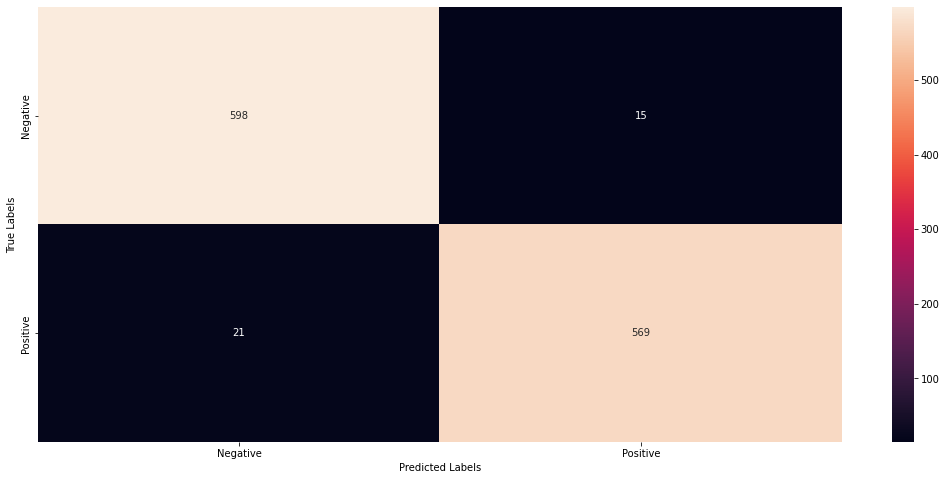

In [220]:
plt.figure(figsize = (18,8))
sns.heatmap(cf_matrix, annot = True,fmt='g', xticklabels = ('Negative','Positive'), yticklabels = ('Negative','Positive'))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# **Implement with Unseen Data**

## Import

In [221]:
import pandas as pd
import numpy as np

In [222]:
df_unseen = pd.read_csv('preprocessed_unseen_data.csv').drop(['Unnamed: 0', 'Rating'],axis=1)

In [223]:
df_unseen

,Review_split
0,มาพักเป็นครั้งที่ แล้วค่ะ ประทับใจตั้งแต่ทำเลข...
1,บริการดี ประทับใจ เดินทางสะดวกครับ ใกล้แหล่งขอ...
2,การบริการดีและห้องสวยงามห้องน้ำสะอาดมีที่จอดรถ...
3,ทำเลโรงแรมดีมากค่ะ ห้องกว้างห้องน้ำก็กว้างสมรา...
4,ห้องดีมากสะอาดห้องน้ำสะอาดแอร์เย็นฉ่ำพนักงานบร...
...,...
1168,จองไว้สามห้อง เพราะเช้าต้องมีไปทำธุระแถวสยาม ก...
1169,ทำเลดีมาก เดินขึ้น bts ได้เลย ราคาค่อนข้างถูก ...
1170,น ตามที่แจ้งว่าสามารถเช็คอินได้ แต่เมื่อไปถึง ...
1171,ห้องพักสะอาด


In [224]:
df_unseen = df_unseen.rename(columns={'Review_split':'Review'})
df_unseen

,Review
0,มาพักเป็นครั้งที่ แล้วค่ะ ประทับใจตั้งแต่ทำเลข...
1,บริการดี ประทับใจ เดินทางสะดวกครับ ใกล้แหล่งขอ...
2,การบริการดีและห้องสวยงามห้องน้ำสะอาดมีที่จอดรถ...
3,ทำเลโรงแรมดีมากค่ะ ห้องกว้างห้องน้ำก็กว้างสมรา...
4,ห้องดีมากสะอาดห้องน้ำสะอาดแอร์เย็นฉ่ำพนักงานบร...
...,...
1168,จองไว้สามห้อง เพราะเช้าต้องมีไปทำธุระแถวสยาม ก...
1169,ทำเลดีมาก เดินขึ้น bts ได้เลย ราคาค่อนข้างถูก ...
1170,น ตามที่แจ้งว่าสามารถเช็คอินได้ แต่เมื่อไปถึง ...
1171,ห้องพักสะอาด


ตัดอักษรเรื่อยเปื่อย

In [225]:
import re
def remove_unvalue(data):
    emoj = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
                      "]+", re.UNICODE)
    return re.sub(emoj, '', data)

In [226]:
def filter_contents(text):
    text_filtered = ''.join([i for i in text if not i.isdigit()])
    for i in ['...','..','.',"#","'","%","?","#","@","!","\xa0",'/','"',")","(","-","_",'“','”',"ๆ","'์","ฯลฯ","ฯ","&","<",">",".","+",":",'\n']:
        text_filtered = text_filtered.replace(i,"")
        text_filtered = text_filtered.replace(","," ")
    return text_filtered

In [227]:
#df_unseen['Review'] = df_unseen['Review'].apply(filter_contents)
#df_unseen['Review'] = df_unseen['Review'].apply(remove_unvalue)

In [228]:
df_unseen

,Review
0,มาพักเป็นครั้งที่ แล้วค่ะ ประทับใจตั้งแต่ทำเลข...
1,บริการดี ประทับใจ เดินทางสะดวกครับ ใกล้แหล่งขอ...
2,การบริการดีและห้องสวยงามห้องน้ำสะอาดมีที่จอดรถ...
3,ทำเลโรงแรมดีมากค่ะ ห้องกว้างห้องน้ำก็กว้างสมรา...
4,ห้องดีมากสะอาดห้องน้ำสะอาดแอร์เย็นฉ่ำพนักงานบร...
...,...
1168,จองไว้สามห้อง เพราะเช้าต้องมีไปทำธุระแถวสยาม ก...
1169,ทำเลดีมาก เดินขึ้น bts ได้เลย ราคาค่อนข้างถูก ...
1170,น ตามที่แจ้งว่าสามารถเช็คอินได้ แต่เมื่อไปถึง ...
1171,ห้องพักสะอาด


## ตัดคำ

In [229]:
df_tokened_unseen = df_unseen['Review'].apply(tokenize)

In [230]:
df_tokened_unseen

0       [มา, พัก, เป็น, ครั้ง, ที่, แล้ว, ค่ะ, ประทับใ...
1       [บริการ, ดี, ประทับใจ, เดินทาง, สะดวก, ครับ, ใ...
2       [การ, บริการ, ดี, และ, ห้อง, สวยงาม, ห้องน้ำ, ...
3       [ทำเล, โรง, แรม, ดี, มาก, ค่ะ, ห้อง, กว้าง, ห้...
4       [ห้อง, ดี, มาก, สะอาด, ห้องน้ำ, สะอาด, แอร์, เ...
                              ...                        
1168    [จอง, ไว้, สาม, ห้อง, เพราะ, เช้า, ต้อง, มี, ไ...
1169    [ทำเล, ดี, มาก, เดิน, ขึ้น, bts, ได้, เลย, ราค...
1170    [น, ตาม, ที่, แจ้ง, ว่า, สามารถ, เช็ค, อิน, ได...
1171                                   [ห้อง, พัก, สะอาด]
1172                      [อีก, เดือน, เจอ, กัน, นะ, ค่ะ]
Name: Review, Length: 1173, dtype: object

## TF-IDF

In [231]:
tfidf_vector_unseen = tfidf_vectorizer.fit_transform(df_tokened_unseen)
features_unseen = tfidf_vectorizer.get_feature_names()
tfidf_array_unseen = np.array(tfidf_vector_unseen.todense())

df_features_unseen = pd.DataFrame(tfidf_array_unseen,columns=tfidf_vectorizer.get_feature_names())
df_features_unseen

a  abloom  activates  agoda  airport  and  areas  arl  asia  bangkok  \
0    0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   
1    0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   
2    0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   
3    0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   
4    0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   
...   ...     ...        ...    ...      ...  ...    ...  ...   ...      ...   
1168 0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   
1169 0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   
1170 0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   
1171 0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   
1172 0.00    0.00       0.00   0.00     0.00 0.00   0.00 0.00  0.00     0.00   

      bassik  bed  bedroom  blade  bloom  brown  bts  btsmrt  btsสนาม  \
0       0.00 0.00     0.00   0.00   0.00   0.00 0.00    0.00     0.00   
1       0.00 0.00     0.00   0.00   0.00   0.00 0.00    0.00     0.00   
2       0.00 0.00     0.00   0.00   0.00   0.00 0.00    0.00     0.00   
3       0.00 0.00     0.00   0.00   0.00   0.00 0.00    0.00     0.00   
4       0.00 0.00     0.00   0.00   0.00   0.00 0.24    0.00     0.00   
...      ...  ...      ...    ...    ...    ...  ...     ...      ...   
1168    0.00 0.00     0.00   0.00   0.00   0.00 0.00    0.00     0.00   
1169    0.00 0.00     0.00   0.00   0.00   0.00 0.14    0.00     0.00   
1170    0.00 0.00     0.00   0.00   0.00   0.00 0.00    0.00     0.00   
1171    0.00 0.00     0.00   0.00   0.00   0.00 0.00    0.00     0.00   
1172    0.00 0.00     0.00   0.00   0.00   0.00 0.00    0.00     0.00   

      btsสนามกีฬา  but  cafe  card  cart  center  central  check  checkin  \
0            0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   
1            0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   
2            0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   
3            0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   
4            0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   
...           ...  ...   ...   ...   ...     ...      ...    ...      ...   
1168         0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   
1169         0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   
1170         0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   
1171         0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   
1172         0.00 0.00  0.00  0.00  0.00    0.00     0.00   0.00     0.00   

      choice  chula  city  close  cold  combine  comfirm  ctip  ctrip  cubic  \
0       0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   
1       0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   
2       0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   
3       0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   
4       0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   
...      ...    ...   ...    ...   ...      ...      ...   ...    ...    ...   
1168    0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   
1169    0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   
1170    0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   
1171    0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   
1172    0.00   0.00  0.00   0.00  0.00     0.00     0.00  0.00   0.00   0.00   

      day  decathlon  deluxe  design  dirty  discovery  donki  double  duty  \
0    0.00       0.00    0.00    0.00   0.00       0.00   0.00    0.00  0.00   
1    0.00       0.00    0.00    0.00   0.00       0.00   0.00    0.00  0.00   
2    0.00       0.00    0.00    0.00   0.00    

In [232]:
tfidf_array_unseen

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

ปรับ จำนวน feature ของ tfidf_array_unseen ให้เท่ากับ lr model

In [233]:
not_existing_cols = [c for c in df_features.columns.tolist() if c not in df_features_unseen]
# add this columns to the data frame
df_features_unseen = df_features_unseen.reindex(df_features_unseen.columns.tolist() + not_existing_cols, axis=1)
# new columns dont have values, replace null by 0
df_features_unseen.fillna(0, inplace = True)
# use the original X structure as mask for the new inference dataframe
df_features_unseen = df_features_unseen[df_features.columns.tolist()]

In [234]:
df_features_unseen

a  abang  abf   ac  accor   ai  aircond  airport  airportlink  aja  \
0    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
1    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
2    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
3    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
4    0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
...   ...    ...  ...  ...    ...  ...      ...      ...          ...  ...   
1168 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
1169 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
1170 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
1171 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   
1172 0.00   0.00 0.00 0.00   0.00 0.00     0.00     0.00         0.00 0.00   

      alfamart  alhamdulillah  amaranta  amp  and  app  apss  arl  atmbkk  \
0         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
1         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
2         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
3         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
4         0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
...        ...            ...       ...  ...  ...  ...   ...  ...     ...   
1168      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
1169      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
1170      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
1171      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   
1172      0.00           0.00      0.00 0.00 0.00 0.00  0.00 0.00    0.00   

      aลง    b  backpacker  backpackers  backpekeran  bad  baiyoke  bakpau  \
0    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
1    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
2    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
3    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
4    0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
...   ...  ...         ...          ...          ...  ...      ...     ...   
1168 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
1169 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
1170 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
1171 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   
1172 0.00 0.00        0.00         0.00         0.00 0.00     0.00    0.00   

      bangkok  basic  bath  bayoke  bayoksky  bed  belanja  bellboys  ben  \
0        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
1        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
2        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
3        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
4        0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
...       ...    ...   ...     ...       ...  ...      ...       ...  ...   
1168     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
1169     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
1170     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
1171     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   
1172     0.00   0.00  0.00    0.00      0.00 0.00     0.00      0.00 0.00   

      bff  bgt  bid  big  bit  bitchy  bkk  bmk  bmw  booking  botol  \
0    0.00 0.00 0.00 0.00 0.00    0.00 0.00 0.00 0.00     0.00   0.00   
1    0.00 0.00 0.00 0.00 0.00    0.00 0.00 0.00 0.00     0.00   0.00   
2    0.00 0.00 0.00 0.00 0.00    0.00 0.00 0.00 0.00     0.00   0.00

**Use with model**

In [235]:
y_pred_unseen = lr.predict(df_features_unseen)

In [236]:
new_series = pd.Series(y_pred_unseen)

In [237]:
df_unseen = pd.concat(([df_unseen,new_series]) , axis=1)

In [238]:
df_unseen = df_unseen.set_axis(['Review','Label'], axis=1)
df_unseen


,Review,Label
0,มาพักเป็นครั้งที่ แล้วค่ะ ประทับใจตั้งแต่ทำเลข...,Positive
1,บริการดี ประทับใจ เดินทางสะดวกครับ ใกล้แหล่งขอ...,Positive
2,การบริการดีและห้องสวยงามห้องน้ำสะอาดมีที่จอดรถ...,Positive
3,ทำเลโรงแรมดีมากค่ะ ห้องกว้างห้องน้ำก็กว้างสมรา...,Negative
4,ห้องดีมากสะอาดห้องน้ำสะอาดแอร์เย็นฉ่ำพนักงานบร...,Positive
...,...,...
1168,จองไว้สามห้อง เพราะเช้าต้องมีไปทำธุระแถวสยาม ก...,Negative
1169,ทำเลดีมาก เดินขึ้น bts ได้เลย ราคาค่อนข้างถูก ...,Positive
1170,น ตามที่แจ้งว่าสามารถเช็คอินได้ แต่เมื่อไปถึง ...,Negative
1171,ห้องพักสะอาด,Positive


In [239]:
df_unseen['Label'].value_counts()

Positive    821
Negative    352
Name: Label, dtype: int64

**Merge All Data**

In [240]:
df_all = pd.concat([df,df_unseen]).reset_index().drop('index',axis=1)
df_all

,Review,Label
0,น่าเกลียดมาก มาก บริการเป็น bitchy bitchy ห้อง...,Negative
1,ใกล้ตลาดประตูน้ำ หากคุณต้องการซื้อสินค้าในตลาด...,Positive
2,ไม่ดีมากไม่สะอาดห้องขี้เกียจพนักงาน,Negative
3,ตลาดที่ดีและใกล้กับห้างสรรพสินค้า,Positive
4,นอนหลับได้ดีเพียงแค่ต้องการเข้าไปในตรอกและรถตุ...,Negative
...,...,...
4126,จองไว้สามห้อง เพราะเช้าต้องมีไปทำธุระแถวสยาม ก...,Negative
4127,ทำเลดีมาก เดินขึ้น bts ได้เลย ราคาค่อนข้างถูก ...,Positive
4128,น ตามที่แจ้งว่าสามารถเช็คอินได้ แต่เมื่อไปถึง ...,Negative
4129,ห้องพักสะอาด,Positive


In [241]:
df_all['Label'].value_counts()

Positive    2826
Negative    1305
Name: Label, dtype: int64

# Apriori Procedures

แยก ข้อมูลออกตาม class เพื่อใช้ในการวิเคราะห์ขั้นต่อไป

In [242]:
neg_class = df_all.drop(df_all[df_all['Label'] == 'Positive'].index)
pos_class = df_all.drop(df_all[df_all['Label'] == 'Negative'].index)

In [243]:
neg_class = neg_class.reset_index().drop(['index'],axis=1)
pos_class = pos_class.reset_index().drop(['index'],axis=1)

In [244]:
neg_class

,Review,Label
0,น่าเกลียดมาก มาก บริการเป็น bitchy bitchy ห้อง...,Negative
1,ไม่ดีมากไม่สะอาดห้องขี้เกียจพนักงาน,Negative
2,นอนหลับได้ดีเพียงแค่ต้องการเข้าไปในตรอกและรถตุ...,Negative
3,อาคารเก่าเพราะเป็นโรงแรมระดับ ดาว wifi อยู่ที่...,Negative
4,จากการขึ้นมาเพื่อตรวจสอบคำพูดที่ดีมาก ห้องพักโ...,Negative
...,...,...
1300,ห้องสะอาด ทำเลสะดวก ติดรถไฟฟ้า เข้าห้องไปเหมือ...,Negative
1301,ห้องเล็กคับแคบมากกกกกกกกก,Negative
1302,อาหารเช้าดีสมราคา ทำเลดีมาก ห้องน้ำเล็กแต่พอเพ...,Negative
1303,จองไว้สามห้อง เพราะเช้าต้องมีไปทำธุระแถวสยาม ก...,Negative


In [245]:
pos_class

,Review,Label
0,ใกล้ตลาดประตูน้ำ หากคุณต้องการซื้อสินค้าในตลาด...,Positive
1,ตลาดที่ดีและใกล้กับห้างสรรพสินค้า,Positive
2,การบริการที่ดีใกล้กับตลาดและตลาดประตูน้ำประตูน...,Positive
3,โรงแรมสะอาดแผนที่ไม่เคยหายไป ผู้เป็นที่รักน่ารัก,Positive
4,นับเป็นครั้งที่เจ็ดในการเข้าพักที่โรงแรมสยามสต...,Positive
...,...,...
2821,เดินทางสะดวก ปลอดภัย,Positive
2822,ปลั๊กน้อยไปหน่อย นอกนั้นดีมาก ทำเลดีมาก,Positive
2823,ทำเลดีมาก เดินขึ้น bts ได้เลย ราคาค่อนข้างถูก ...,Positive
2824,ห้องพักสะอาด,Positive


# **Apriori**

**Transform Data**

Tokenize and Create Bag-of-Words (BoW)


In [246]:
def tokenize_apriori(text):
    return word_tokenize(text,engine ='longest', keep_whitespace=False)

In [247]:
# ----------------------------
# BASE
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt

# ----------------------------
# INSTALL
#!pip install mlxtend

# ----------------------------
# TRANSACTION ENCODER
from mlxtend.preprocessing import TransactionEncoder

# ----------------------------
# APRIORI FUNCTION 
from mlxtend.frequent_patterns import apriori, association_rules

# ----------------------------
# ITERTOOLS 
import itertools

# ----------------------------
# CONFIGURATION
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format

In [248]:
from mlxtend.preprocessing import TransactionEncoder

## **Pos Class Apriori**

In [249]:
pos_class['Review_token'] = pos_class['Review'].apply(tokenize)
pos_class_ls = pos_class['Review'].apply(tokenize_apriori).tolist()

In [250]:
stop_word = thai_stopwords()
pos_stopwords = set(stop_word)

In [251]:
no = ['พัก','ดี','ฟ้า']
pos_stopwords.update(no)

In [252]:
pos_class_ls_un_stopword = list()
for ls in pos_class_ls:
  list_word_not_stopwords = [i for i in ls if i not in pos_stopwords]
  pos_class_ls_un_stopword.append(list_word_not_stopwords)
list_word_not_stopwords = []

In [253]:
te_pos = TransactionEncoder()
pos_ary = te_pos.fit(pos_class_ls_un_stopword).transform(pos_class_ls_un_stopword)
pos_ary

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [254]:
df_pos_ary = pd.DataFrame(pos_ary,columns=te_pos.columns_)
df_pos_ary

a  abang    abf     ac     ai  airport  airportlink  alfamart  \
0     False  False  False  False  False    False        False     False   
1     False  False  False  False  False    False        False     False   
2     False  False  False  False  False    False        False     False   
3     False  False  False  False  False    False        False     False   
4     False  False  False  False  False    False        False     False   
...     ...    ...    ...    ...    ...      ...          ...       ...   
2821  False  False  False  False  False    False        False     False   
2822  False  False  False  False  False    False        False     False   
2823  False  False  False  False  False    False        False     False   
2824  False  False  False  False  False    False        False     False   
2825  False  False  False  False  False    False        False     False   

      alhamdulillah  amaranta  amazon    amp    and    app    arl   asia  \
0             False     False   False  False  False  False  False  False   
1             False     False   False  False  False  False  False  False   
2             False     False   False  False  False  False  False  False   
3             False     False   False  False  False  False  False  False   
4             False     False   False  False  False  False  False  False   
...             ...       ...     ...    ...    ...    ...    ...    ...   
2821          False     False   False  False  False  False  False  False   
2822          False     False   False  False  False  False  False  False   
2823          False     False   False  False  False  False  False  False   
2824          False     False   False  False  False  False  False  False   
2825          False     False   False  False  False  False  False  False   

      atmbkk    aum  backpacker  backpackers  backpekeran  baiyoke  bakpau  \
0      False  False       False        False        False    False   False   
1      False  False       False        False        False    False   False   
2      False  False       False        False        False    False   False   
3      False  False       False        False        False    False   False   
4      False  False       False        False        False    False   False   
...      ...    ...         ...          ...          ...      ...     ...   
2821   False  False       False        False        False    False   False   
2822   False  False       False        False        False    False   False   
2823   False  False       False        False        False    False   False   
2824   False  False       False        False        False    False   False   
2825   False  False       False        False        False    False   False   

      bangkok  basic   bath  bayoke  bayoksky    bed  belanja  bellboys  \
0       False  False  False   False     False  False    False     False   
1       False  False  False   False     False  False    False     False   
2       False  False  False   False     False  False    False     False   
3       False  False  False   False     False  False    False     False   
4       False  False  False   False     False  False    False     False   
...       ...    ...    ...     ...       ...    ...      ...       ...   
2821    False  False  False   False     False  False    False     False   
2822    False  False  False   False     False  False    False     False   
2823    False  False  False   False     False  False    False     False   
2824    False  False  False   False     False  False    False     False   
2825    False  False  False   False     False  False    False     False   

        bff    bgt    bid    big    bit    bkk    bmk    bmw  botol  \
0     False  False  False  False  False  False  False  False  False   
1     False  False  False  False  False  False  False  False  False   
2     False  False  False  False  False  False  False  False  False   
3     False  False  False  False  False  False  False  False  False   
4  

In [282]:
# Apriori
freq_items_pos = apriori(df_pos_ary, min_support = 0.01, use_colnames = True)
freq_item_table_pos = freq_items_pos.sort_values("support", ascending = False)
freq_item_table_pos['support'] = freq_item_table_pos['support'].astype(float)
freq_item_table_pos['support'].mean()

0.02247351895584426

In [286]:
# Association Rules & Info
rules_pos = association_rules(freq_item_table_pos, metric = "support", min_threshold = 0.0225)
rules_pos

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(ห้องพัก),(สะอาด),0.26,0.40,0.17,0.64,1.61,0.06,1.68
1,(สะอาด),(ห้องพัก),0.40,0.26,0.17,0.42,1.61,0.06,1.27
2,(สะดวก),(เดินทาง),0.25,0.19,0.16,0.63,3.30,0.11,2.20
3,(เดินทาง),(สะดวก),0.19,0.25,0.16,0.83,3.30,0.11,4.33
4,(สะอาด),(โรงแรม),0.40,0.29,0.12,0.31,1.06,0.01,1.02
...,...,...,...,...,...,...,...,...,...
489,"(ห้องพัก, โรงแรม)",(บริการ),0.09,0.21,0.02,0.26,1.22,0.00,1.06
490,"(บริการ, โรงแรม)",(ห้องพัก),0.07,0.26,0.02,0.35,1.34,0.01,1.13
491,(ห้องพัก),"(บริการ, โรงแรม)",0.26,0.07,0.02,0.09,1.34,0.01,1.02
492,(บริการ),"(ห้องพัก, โรงแรม)",0.21,0.09,0.02,0.11,1.22,0.00,1.02


In [287]:
rules_pos['union'] = [x | y for x, y in zip(rules_pos['antecedents'], rules_pos['consequents'])]

In [288]:
rules_pos

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,union
0,(ห้องพัก),(สะอาด),0.26,0.40,0.17,0.64,1.61,0.06,1.68,"(ห้องพัก, สะอาด)"
1,(สะอาด),(ห้องพัก),0.40,0.26,0.17,0.42,1.61,0.06,1.27,"(ห้องพัก, สะอาด)"
2,(สะดวก),(เดินทาง),0.25,0.19,0.16,0.63,3.30,0.11,2.20,"(สะดวก, เดินทาง)"
3,(เดินทาง),(สะดวก),0.19,0.25,0.16,0.83,3.30,0.11,4.33,"(สะดวก, เดินทาง)"
4,(สะอาด),(โรงแรม),0.40,0.29,0.12,0.31,1.06,0.01,1.02,"(สะอาด, โรงแรม)"
...,...,...,...,...,...,...,...,...,...,...
489,"(ห้องพัก, โรงแรม)",(บริการ),0.09,0.21,0.02,0.26,1.22,0.00,1.06,"(ห้องพัก, บริการ, โรงแรม)"
490,"(บริการ, โรงแรม)",(ห้องพัก),0.07,0.26,0.02,0.35,1.34,0.01,1.13,"(ห้องพัก, บริการ, โรงแรม)"
491,(ห้องพัก),"(บริการ, โรงแรม)",0.26,0.07,0.02,0.09,1.34,0.01,1.02,"(ห้องพัก, บริการ, โรงแรม)"
492,(บริการ),"(ห้องพัก, โรงแรม)",0.21,0.09,0.02,0.11,1.22,0.00,1.02,"(ห้องพัก, บริการ, โรงแรม)"


In [289]:
#Since, All these association rules has confidence ≥50% then all can be considered as strong association rules.
#A Lift of 1 means there is no association between products A and B. 
#Lift of greater than 1 means products A and B are more likely to be bought together. 
#Finally, Lift of less than 1 refers to the case where two products are unlikely to be bought together.

rules_pos_good = rules_pos[(rules_pos['confidence'] >= 0.5) & (rules_pos['lift'] > 1)]

In [290]:
rules_pos_good 

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,union
0,(ห้องพัก),(สะอาด),0.26,0.40,0.17,0.64,1.61,0.06,1.68,"(ห้องพัก, สะอาด)"
2,(สะดวก),(เดินทาง),0.25,0.19,0.16,0.63,3.30,0.11,2.20,"(สะดวก, เดินทาง)"
3,(เดินทาง),(สะดวก),0.19,0.25,0.16,0.83,3.30,0.11,4.33,"(สะดวก, เดินทาง)"
8,(ห้อง),(สะอาด),0.21,0.40,0.11,0.53,1.33,0.03,1.28,"(ห้อง, สะอาด)"
18,"(สะดวก, สะอาด)",(เดินทาง),0.12,0.19,0.08,0.66,3.45,0.06,2.40,"(สะดวก, สะอาด, เดินทาง)"
...,...,...,...,...,...,...,...,...,...,...
444,"(สะดวก, bts)",(เดินทาง),0.04,0.19,0.02,0.67,3.50,0.02,2.47,"(สะดวก, bts, เดินทาง)"
446,"(bts, เดินทาง)",(สะดวก),0.03,0.25,0.02,0.80,3.19,0.02,3.75,"(สะดวก, bts, เดินทาง)"
450,"(พนักงาน, ห้อง)",(สะอาด),0.04,0.40,0.02,0.54,1.35,0.01,1.30,"(พนักงาน, สะอาด, ห้อง)"
457,"(อาหารเช้า, สำหรับ)",(โรงแรม),0.03,0.29,0.02,0.79,2.71,0.01,3.35,"(อาหารเช้า, โรงแรม, สำหรับ)"


In [291]:
sorted_rules_pos = rules_pos_good.sort_values("lift", ascending=False)
sorted_rules_pos

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,union
318,"(โรงแรม, ตลาด)",(ประตูน้ำ),0.04,0.07,0.03,0.67,10.17,0.03,2.83,"(ประตูน้ำ, โรงแรม, ตลาด)"
317,"(ประตูน้ำ, โรงแรม)",(ตลาด),0.04,0.07,0.03,0.66,9.74,0.03,2.73,"(ประตูน้ำ, ตลาด, โรงแรม)"
103,(ตลาด),(ประตูน้ำ),0.07,0.07,0.04,0.62,9.47,0.04,2.48,"(ประตูน้ำ, ตลาด)"
102,(ประตูน้ำ),(ตลาด),0.07,0.07,0.04,0.64,9.47,0.04,2.59,"(ประตูน้ำ, ตลาด)"
406,(นาที),(เดิน),0.03,0.09,0.03,0.81,9.38,0.02,4.73,"(นาที, เดิน)"
...,...,...,...,...,...,...,...,...,...,...
450,"(พนักงาน, ห้อง)",(สะอาด),0.04,0.40,0.02,0.54,1.35,0.01,1.30,"(พนักงาน, สะอาด, ห้อง)"
8,(ห้อง),(สะอาด),0.21,0.40,0.11,0.53,1.33,0.03,1.28,"(ห้อง, สะอาด)"
372,"(สะดวก, ดีมาก)",(สะอาด),0.05,0.40,0.03,0.53,1.33,0.01,1.28,"(สะดวก, ดีมาก, สะอาด)"
98,(สะดวกสบาย),(สะอาด),0.08,0.40,0.04,0.52,1.32,0.01,1.26,"(สะดวกสบาย, สะอาด)"


In [292]:
sorted_rules_pos["unfrozenset"] = sorted_rules_pos["union"].apply(lambda x: ', '.join(list(x))).astype("unicode").tolist()
sorted_rules_pos

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,union,unfrozenset
318,"(โรงแรม, ตลาด)",(ประตูน้ำ),0.04,0.07,0.03,0.67,10.17,0.03,2.83,"(ประตูน้ำ, โรงแรม, ตลาด)","ประตูน้ำ, โรงแรม, ตลาด"
317,"(ประตูน้ำ, โรงแรม)",(ตลาด),0.04,0.07,0.03,0.66,9.74,0.03,2.73,"(ประตูน้ำ, ตลาด, โรงแรม)","ประตูน้ำ, ตลาด, โรงแรม"
103,(ตลาด),(ประตูน้ำ),0.07,0.07,0.04,0.62,9.47,0.04,2.48,"(ประตูน้ำ, ตลาด)","ประตูน้ำ, ตลาด"
102,(ประตูน้ำ),(ตลาด),0.07,0.07,0.04,0.64,9.47,0.04,2.59,"(ประตูน้ำ, ตลาด)","ประตูน้ำ, ตลาด"
406,(นาที),(เดิน),0.03,0.09,0.03,0.81,9.38,0.02,4.73,"(นาที, เดิน)","นาที, เดิน"
...,...,...,...,...,...,...,...,...,...,...,...
450,"(พนักงาน, ห้อง)",(สะอาด),0.04,0.40,0.02,0.54,1.35,0.01,1.30,"(พนักงาน, สะอาด, ห้อง)","พนักงาน, สะอาด, ห้อง"
8,(ห้อง),(สะอาด),0.21,0.40,0.11,0.53,1.33,0.03,1.28,"(ห้อง, สะอาด)","ห้อง, สะอาด"
372,"(สะดวก, ดีมาก)",(สะอาด),0.05,0.40,0.03,0.53,1.33,0.01,1.28,"(สะดวก, ดีมาก, สะอาด)","สะดวก, ดีมาก, สะอาด"
98,(สะดวกสบาย),(สะอาด),0.08,0.40,0.04,0.52,1.32,0.01,1.26,"(สะดวกสบาย, สะอาด)","สะดวกสบาย, สะอาด"


## **Neg Class Appriori**

In [293]:
neg_class['Review_token'] = neg_class['Review'].apply(tokenize) #neg
neg_class_ls = neg_class['Review'].apply(tokenize_apriori).tolist()

In [294]:
stop_word = thai_stopwords()
neg_stopwords = set(stop_word)

In [295]:
no = ['พัก','ดี','ฟ้า','สำหรับ']
neg_stopwords.update(no)

In [296]:
neg_class_ls_un_stopword = list()   #neg
for ls in neg_class_ls:
  list_word_not_stopwords = [i for i in ls if i not in neg_stopwords]
  neg_class_ls_un_stopword.append(list_word_not_stopwords)
list_word_not_stopwords = []

In [297]:
te_neg = TransactionEncoder()
neg_ary = te_neg.fit(neg_class_ls_un_stopword).transform(neg_class_ls_un_stopword)  #neg
neg_ary

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [298]:
df_neg_ary = pd.DataFrame(neg_ary,columns=te_neg.columns_)  #neg
df_neg_ary

a  abloom     ac  accident  accor  activates  agoda  aircond    aja  \
0     False   False  False     False  False      False  False    False  False   
1     False   False  False     False  False      False  False    False  False   
2     False   False  False     False  False      False  False    False  False   
3     False   False  False     False  False      False  False    False  False   
4     False   False  False     False  False      False  False    False  False   
...     ...     ...    ...       ...    ...        ...    ...      ...    ...   
1300  False   False  False     False  False      False  False    False  False   
1301  False   False  False     False  False      False  False    False  False   
1302  False   False  False     False  False      False  False    False  False   
1303  False   False  False     False  False      False  False    False  False   
1304  False   False  False     False  False      False  False    False  False   

        amp    and    app   apss  areas    arl    atm      b    bad  bassik  \
0     False  False  False  False  False  False  False  False  False   False   
1     False  False  False  False  False  False  False  False  False   False   
2     False  False  False  False  False  False  False  False  False   False   
3     False  False  False  False  False  False  False  False  False   False   
4     False  False  False  False  False  False  False  False  False   False   
...     ...    ...    ...    ...    ...    ...    ...    ...    ...     ...   
1300  False  False  False  False  False  False  False  False  False   False   
1301  False  False  False  False  False  False  False  False  False   False   
1302  False  False  False  False  False  False  False  False  False   False   
1303  False  False  False  False  False  False  False  False  False   False   
1304  False  False  False  False  False  False  False  False  False   False   

        bed  bedroom    ben  bitchy    bkk  blade  bloom   book  booking  \
0     False    False  False    True  False  False  False  False    False   
1     False    False  False   False  False  False  False  False    False   
2     False    False  False   False  False  False  False  False    False   
3     False    False  False   False  False  False  False  False    False   
4     False    False  False   False  False  False  False  False    False   
...     ...      ...    ...     ...    ...    ...    ...    ...      ...   
1300  False    False  False   False  False  False  False  False    False   
1301  False    False  False   False  False  False  False  False    False   
1302  False    False  False   False  False  False  False  False    False   
1303  False    False  False   False  False  False  False  False    False   
1304  False    False  False   False  False  False  False  False    False   

      britau  broken  brown    bte    bts  btsmrt    but      c   cafe   card  \
0      False   False  False  False  False   False  False  False  False  False   
1      False   False  False  False  False   False  False  False  False  False   
2      False   False  False  False  False   False  False  False  False  False   
3      False   False  False  False  False   False  False  False  False  False   
4      False   False  False  False  False   False  False  False  False  False   
...      ...     ...    ...    ...    ...     ...    ...    ...    ...    ...   
1300   False   False  False  False  False   False  False  False  False  False   
1301   False   False  False  False  False   False  False  False  False  False   
1302   False   False  False  False  False   False  False  False  False   True   
1303   False   False  False  False  False   False  False  False  False  False   
1304   False   False  False  False  False   False  False  False  False  False   

      check  checkin  choice  close   cold  combine    con  coros  costumer  \
0     False    False   False  False  False    False  False  False     False   
1     False    False   False  False  False  

**Apply with Apriori (Pattern)**

In [299]:
# Apriori #neg
freq_items_neg = apriori(df_neg_ary, min_support = 0.02, use_colnames = True)
freq_item_table_neg = freq_items_neg.sort_values("support", ascending = False)
freq_item_table_neg['support'] = freq_item_table_neg['support'].astype(float)
freq_item_table_neg['support'].mean()

0.03912040820032322

In [300]:
# Association Rules & Info  #neg
rules_neg = association_rules(freq_item_table_neg, metric = "support", min_threshold = 0.0391)
rules_neg

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(ห้อง),(โรงแรม),0.44,0.31,0.15,0.33,1.06,0.01,1.03
1,(โรงแรม),(ห้อง),0.31,0.44,0.15,0.47,1.06,0.01,1.05
2,(ห้อง),(ห้องน้ำ),0.44,0.18,0.10,0.22,1.22,0.02,1.05
3,(ห้องน้ำ),(ห้อง),0.18,0.44,0.10,0.54,1.22,0.02,1.22
4,(ห้อง),(ห้องพัก),0.44,0.21,0.09,0.21,0.99,-0.00,1.00
...,...,...,...,...,...,...,...,...,...
103,(บริการ),(พนักงาน),0.14,0.18,0.04,0.30,1.70,0.02,1.18
104,(ห้อง),(สกปรก),0.44,0.08,0.04,0.09,1.14,0.00,1.01
105,(สกปรก),(ห้อง),0.08,0.44,0.04,0.50,1.14,0.00,1.13
106,(คน),(พนักงาน),0.13,0.18,0.04,0.31,1.78,0.02,1.20


In [301]:
rules_neg['union'] = [x | y for x, y in zip(rules_neg['antecedents'], rules_neg['consequents'])] #neg

In [302]:
rules_neg   #neg

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,union
0,(ห้อง),(โรงแรม),0.44,0.31,0.15,0.33,1.06,0.01,1.03,"(ห้อง, โรงแรม)"
1,(โรงแรม),(ห้อง),0.31,0.44,0.15,0.47,1.06,0.01,1.05,"(ห้อง, โรงแรม)"
2,(ห้อง),(ห้องน้ำ),0.44,0.18,0.10,0.22,1.22,0.02,1.05,"(ห้อง, ห้องน้ำ)"
3,(ห้องน้ำ),(ห้อง),0.18,0.44,0.10,0.54,1.22,0.02,1.22,"(ห้อง, ห้องน้ำ)"
4,(ห้อง),(ห้องพัก),0.44,0.21,0.09,0.21,0.99,-0.00,1.00,"(ห้อง, ห้องพัก)"
...,...,...,...,...,...,...,...,...,...,...
103,(บริการ),(พนักงาน),0.14,0.18,0.04,0.30,1.70,0.02,1.18,"(พนักงาน, บริการ)"
104,(ห้อง),(สกปรก),0.44,0.08,0.04,0.09,1.14,0.00,1.01,"(ห้อง, สกปรก)"
105,(สกปรก),(ห้อง),0.08,0.44,0.04,0.50,1.14,0.00,1.13,"(ห้อง, สกปรก)"
106,(คน),(พนักงาน),0.13,0.18,0.04,0.31,1.78,0.02,1.20,"(คน, พนักงาน)"


In [303]:
#Since, All these association rules has confidence ≥50% then all can be considered as strong association rules.
#A Lift of 1 means there is no association between products A and B. 
#Lift of greater than 1 means products A and B are more likely to be bought together. 
#Finally, Lift of less than 1 refers to the case where two products are unlikely to be bought together.

rules_neg_good = rules_neg[(rules_neg['confidence'] >= 0.5) & (rules_neg['lift'] > 1)]

In [304]:
rules_neg_good 

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,union
3,(ห้องน้ำ),(ห้อง),0.18,0.44,0.10,0.54,1.22,0.02,1.22,"(ห้อง, ห้องน้ำ)"
10,(อิน),(เช็ค),0.08,0.11,0.08,0.96,8.98,0.07,24.33,"(อิน, เช็ค)"
11,(เช็ค),(อิน),0.11,0.08,0.08,0.75,8.98,0.07,3.67,"(อิน, เช็ค)"
13,(คน),(ห้อง),0.13,0.44,0.08,0.63,1.41,0.02,1.49,"(คน, ห้อง)"
15,(สะอาด),(ห้อง),0.14,0.44,0.08,0.56,1.26,0.02,1.26,"(ห้อง, สะอาด)"
17,(เก่า),(ห้อง),0.14,0.44,0.08,0.56,1.26,0.02,1.26,"(ห้อง, เก่า)"
19,(จอง),(ห้อง),0.09,0.44,0.07,0.80,1.81,0.03,2.81,"(ห้อง, จอง)"
29,(เตียง),(ห้อง),0.11,0.44,0.07,0.64,1.46,0.02,1.57,"(ห้อง, เตียง)"
31,(เช็ค),(ห้อง),0.11,0.44,0.07,0.62,1.40,0.02,1.47,"(ห้อง, เช็ค)"
35,(กลิ่น),(ห้อง),0.08,0.44,0.06,0.68,1.54,0.02,1.75,"(ห้อง, กลิ่น)"


In [305]:
sorted_rules_neg = rules_neg_good.sort_values("lift", ascending=False)
sorted_rules_neg

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,union
11,(เช็ค),(อิน),0.11,0.08,0.08,0.75,8.98,0.07,3.67,"(อิน, เช็ค)"
10,(อิน),(เช็ค),0.08,0.11,0.08,0.96,8.98,0.07,24.33,"(อิน, เช็ค)"
61,"(ห้อง, เช็ค)",(อิน),0.07,0.08,0.05,0.75,8.94,0.04,3.62,"(ห้อง, อิน, เช็ค)"
64,(อิน),"(ห้อง, เช็ค)",0.08,0.07,0.05,0.60,8.94,0.04,2.31,"(ห้อง, อิน, เช็ค)"
60,"(ห้อง, อิน)",(เช็ค),0.05,0.11,0.05,0.96,8.91,0.04,20.23,"(ห้อง, อิน, เช็ค)"
82,(เย็น),(แอร์),0.07,0.08,0.04,0.60,7.68,0.04,2.30,"(เย็น, แอร์)"
83,(แอร์),(เย็น),0.08,0.07,0.04,0.56,7.68,0.04,2.10,"(เย็น, แอร์)"
19,(จอง),(ห้อง),0.09,0.44,0.07,0.80,1.81,0.03,2.81,"(ห้อง, จอง)"
58,(เดิน),(โรงแรม),0.10,0.31,0.05,0.52,1.68,0.02,1.44,"(เดิน, โรงแรม)"
79,(คืน),(ห้อง),0.07,0.44,0.05,0.69,1.55,0.02,1.77,"(ห้อง, คืน)"


In [306]:
sorted_rules_neg["unfrozenset"] = sorted_rules_neg["union"].apply(lambda x: ', '.join(list(x))).astype("unicode")
sorted_rules_neg

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,union,unfrozenset
11,(เช็ค),(อิน),0.11,0.08,0.08,0.75,8.98,0.07,3.67,"(อิน, เช็ค)","อิน, เช็ค"
10,(อิน),(เช็ค),0.08,0.11,0.08,0.96,8.98,0.07,24.33,"(อิน, เช็ค)","อิน, เช็ค"
61,"(ห้อง, เช็ค)",(อิน),0.07,0.08,0.05,0.75,8.94,0.04,3.62,"(ห้อง, อิน, เช็ค)","ห้อง, อิน, เช็ค"
64,(อิน),"(ห้อง, เช็ค)",0.08,0.07,0.05,0.60,8.94,0.04,2.31,"(ห้อง, อิน, เช็ค)","ห้อง, อิน, เช็ค"
60,"(ห้อง, อิน)",(เช็ค),0.05,0.11,0.05,0.96,8.91,0.04,20.23,"(ห้อง, อิน, เช็ค)","ห้อง, อิน, เช็ค"
82,(เย็น),(แอร์),0.07,0.08,0.04,0.60,7.68,0.04,2.30,"(เย็น, แอร์)","เย็น, แอร์"
83,(แอร์),(เย็น),0.08,0.07,0.04,0.56,7.68,0.04,2.10,"(เย็น, แอร์)","เย็น, แอร์"
19,(จอง),(ห้อง),0.09,0.44,0.07,0.80,1.81,0.03,2.81,"(ห้อง, จอง)","ห้อง, จอง"
58,(เดิน),(โรงแรม),0.10,0.31,0.05,0.52,1.68,0.02,1.44,"(เดิน, โรงแรม)","เดิน, โรงแรม"
79,(คืน),(ห้อง),0.07,0.44,0.05,0.69,1.55,0.02,1.77,"(ห้อง, คืน)","ห้อง, คืน"


## ค้นหาคำที่เชื่อมกัน

In [311]:
# ต้องใส่ตัวแรกเป็นตัวใหญ่ ex. Action
x = "เย็น"

In [312]:
# y = str(input())
y = "ห้อง"

In [313]:
tag_name=frozenset({x}) 
#tag_name=frozenset({x,y})#กรณี x,y

In [314]:
recommendation_list=rules_neg[rules_neg["antecedents"]==tag_name]#.iloc[:3,1]#.values
recommendation_list

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,union
81,(เย็น),(ห้อง),0.07,0.44,0.04,0.61,1.38,0.01,1.43,"(ห้อง, เย็น)"
82,(เย็น),(แอร์),0.07,0.08,0.04,0.60,7.68,0.04,2.30,"(เย็น, แอร์)"


# Word Cloud

In [174]:
#Word Cloud
! pip install wordcloud
! pip install pythainlp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [175]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from pythainlp.corpus import thai_stopwords

In [176]:
stop_word = thai_stopwords()
stopwords = set(stop_word)

## **Neg Word cloud**

In [177]:
no = ['ประตู','ตอน','เวลา','เดิน', 'ดี','โรงแรม','ดีมาก','ชอบ','ประทับใจ','สำหรับ','แน่','สวย','เลือก','ดู', 'ที่นี่', 'น่ารัก','พัก','เหมือน','น้ำ','กลับมา','เรื่อง','รอบ','หน้า', 'โอเค','โดยรวม','โรง','แรม','ห้อง','อาหาร','เตียง','นอน','ทำ','สอง','คน','ซัน','สะดวก'
,'แนะนำ','รู้','ชัน','บาท','กลาง','มิตร','น','ช้น','ซ้น','โหน้า', 'โอ', 'โอ โอ', 'ที่จะ', 'รู้สึก']
stopwords.update(no)

In [178]:
neg_class['Review_token']= neg_class['Review_token'].apply(lambda x: " ".join(x) )

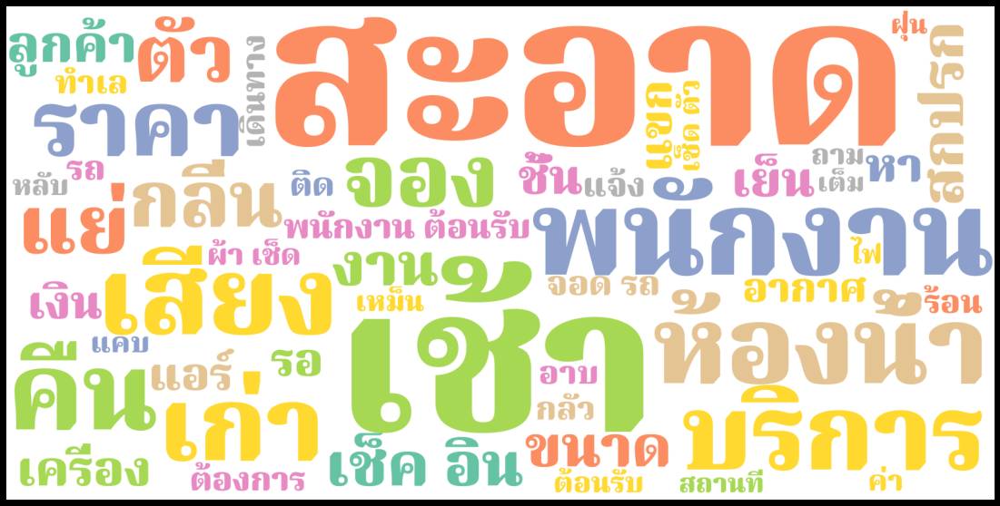

In [179]:
#wordcloud
wordcloud = WordCloud(font_path='NotoSerifThai-Black.ttf' ,stopwords = stopwords, width=1600 , height=800, regexp='[ก-๙a-zA-Z]+', background_color="White" , 
colormap="Set2",  max_words=50).generate(''.join(neg_class['Review_token']))

plt.figure(figsize=(20,10),facecolor='k')
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

## **Pos Word Cloud**

In [180]:
no = ['เดิม','เก่า','แปล','ถนน','ติด','ไม่','นาที','ชัน','ข้อความ','หา','เสียง','เตียง','ข้อ','ซัน','ตัว','แพง','คืน','งาน','ค่ะห้อง']
stopwords.update(no)

In [181]:
pos_class['Review_token']
pos_class['Review_token'] = pos_class['Review_token'].apply(lambda x: " ".join(x) )

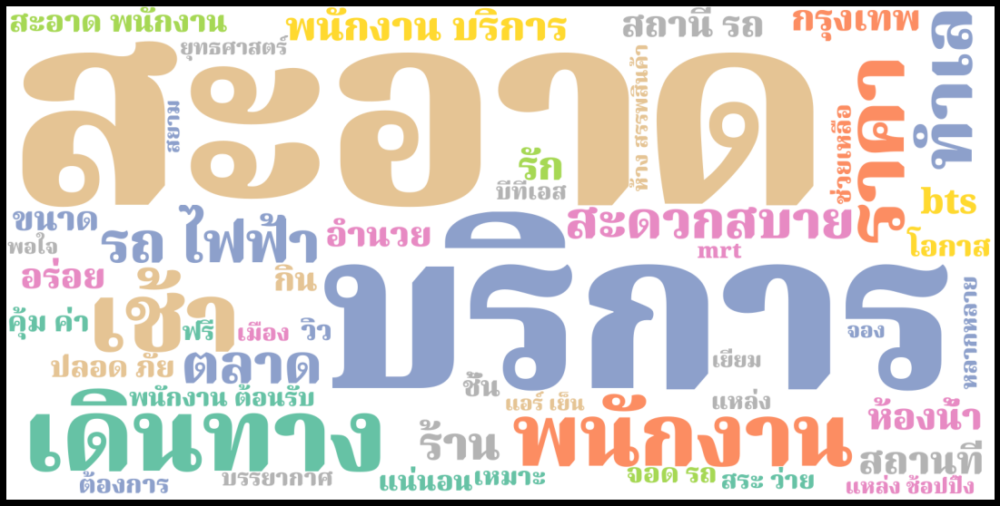

In [182]:
wordcloud = WordCloud(font_path='NotoSerifThai-Black.ttf' ,stopwords = stopwords, width=1600 , height=800, regexp='[ก-๙a-zA-Z]+', background_color="White" , 
colormap="Set2",  max_words=50).generate(''.join(pos_class['Review_token']))

plt.figure(figsize=(20,10),facecolor='k')
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

# **เคยใช้ แต่เก็บไว้ เผื่อโค๊ดหาย**

# **เก็บไว้ก่อน**

In [ ]:
y_test.value_counts()

In [ ]:
test_predictions = pd.Series(test_predictions)
test_predictions.value_counts()

In [ ]:
from sklearn.metrics import confusion_matrix
 
cm = confusion_matrix(y_test,test_predictions)
cm

In [ ]:
plt.figure(figsize = (18,8))
sns.heatmap(metrics.confusion_matrix(y_test, test_predictions), annot = True, xticklabels = y_test.unique(), yticklabels = y_test.unique(), cmap = 'summer')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
 
color = 'white'
matrix = plot_confusion_matrix(lr, X_test, y_test, cmap=plt.cm.Blues)
matrix.ax_.set_title('Confusion Matrix', color=color)
plt.xlabel('Predicted Label', color=color)
plt.ylabel('True Label', color=color)
plt.gcf().axes[0].tick_params(colors=color)
plt.gcf().axes[1].tick_params(colors=color)
plt.show()

**BOW**

In [ ]:
neg_class['Review_token'] = neg_class['Review_token'].apply(lambda x: " ".join(x) )    #neg

In [ ]:
neg_class['Review_token']   #neg

0       น่าเกลียด มาก มาก บริการ เป็น bitchy bitchy ห้...
1               ไม่ ดีมาก ไม่ สะอาด ห้อง ขี้เกียจ พนักงาน
2       จาก การ ขึ้น มา เพื่อ ตรวจสอบ คำพูด ที่ ดีมาก ...
3       แผนกต้อนรับ ส่วนหน้า อาจ มีประโยชน์ มาก แต่ ฉั...
4       สถานที่ ที่ ดี แต่ พนักงาน ที่ ไม่ เป็นมิตร ห้...
                              ...                        
1147    ห้อง สะอาด ทำเล สะดวก ติด รถไฟฟ้า เข้า ห้อง ไป...
1148                     ห้อง เล็ก คับแคบ มาก กก กก กก กก
1149    อาหารเช้า ดี สมราคา ทำเล ดีมาก ห้องน้ำ เล็ก แต...
1150    จอง ไว้ สาม ห้อง เพราะ เช้า ต้อง มี ไป ทำ ธุระ...
1151    น ตามที่ แจ้ง ว่า สามารถ เช็ค อิน ได้ แต่ เมื่...
Name: Review_token, Length: 1152, dtype: object

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

cvec = CountVectorizer(analyzer=lambda x:x.split(' '))
cvec.fit_transform(pos_class['Review_token'])

pos_class_bow = cvec.transform(pos_class['Review_token'])

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

cvec = CountVectorizer(analyzer=lambda x:x.split(' '))
cvec.fit_transform(pos_class['Review_token'])

pos_class_bow = cvec.transform(pos_class['Review_token'])

In [ ]:
df_pos_class_features = pd.DataFrame(pos_class_bow.toarray(), columns=cvec.get_feature_names(), index=pos_class['Review_token'])
df_pos_class_features

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,,a,abang,abf,ac,ai,aircond,airport,airportlink,aja,...,,,️,️️️️,️️️️️️️️️️️,️️️️️️️️️️️️,️️️️️️️️️️️️️️️️️,️️️️️️️️️️️️️️️️️️️️️️️️️️️️️,￼,🇨🇳
Review_token,,,,,,,,,,,,,,,,,,,,,
ใกล้ ตลาด ประตูน้ำ หาก คุณ ต้องการ ซื้อ สินค้า ใน ตลาด pretunam เพียงแค่ เดิน นี่ เป็น ครั้ง ที่สอง ที่ เรา มา อยู่ ที่นี่,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ตลาด ที่ ดี และ ใกล้ กับ ห้างสรรพสินค้า,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
นอนหลับ ได้ดี เพียงแค่ ต้องการ เข้าไป ใน ตรอก และ รถ ตุ๊กตุ๊ก พวกเขา ไม่ รู้ ตำแหน่ง ของ โรงแรม อย่าง ชัดเจน โรงแรม ได้รับ การ ทำความสะอาด ทำไม ทุกครั้งที่ เรา ต้องการ ออก ไป ช้อปปิ้ง คีย์ ห้อง ต้อง ทิ้ง ไว้ ที่ ล็อบบี้,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
อาคาร เก่า เพราะ เป็น โรงแรม ระดับ ดาว wifi อยู่ ที่ ล็อบบี้ บริการ รักษา บ้าน เป็น สิ่ง ที่ ดีมาก ห้อง สำหรับ สอง คน มี ผ้าเช็ดตัว และ สบู่ แต่ ไม่ มี แชมพู และ ยาสีฟัน ห้อง ให้น้ำ ดื่ม สำหรับ ท่าน และ ให้ เรา ขณะที่ เรา มี ห้อง แต่งหน้า แผนกต้อนรับ ส่วนหน้า เป็น เช่นนั้น เธอ เอาใจใส่ ผู้หญิง ที่ เคร่งขรึม นิดหน่อย เมื่อ ดิฉัน ให้ คำถาม ที่ น่าสนใจ แก่ เธอ แต่ ลูกเรือ คนอื่น ก็ดี และ ใจดี ไม่ ใช่ ปัญหา ใหญ่ ลูกเรือ คน หนึ่ง พา ฉัน ไป ที่ ตลาด ประตูน้ำ โดย สามารถ เดิน ได้ ราคา เป็น มูลค่า กับ บริการ,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
การ บริการ ที่ ดี ใกล้ กับ ตลาด และ ตลาด ประตูน้ำ ประตูน้ำ ห้างสรรพสินค้า แฟชั่น ถ้า คุณ ต้องการ เพื่อให้ พอดี กับ การ ช้อปปิ้ง ที่นี่ เพราะ มี เครื่องชั่งน้ำหนัก ใน โรงแรม ของ เธอ,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
เดินทาง สะดวก ปลอดภัย,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ปลั๊ก น้อย ไป หน่อย นอกนั้น ดีมาก ทำเล ดีมาก,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ทำเล ดีมาก เดิน ขึ้น bts ได้ เลย ราคา ค่อนข้าง ถูก อาหารเช้า หลากหลาย และ รสชาติ ดีมาก ขนาด ห้อง จะ เล็ก ไป หน่อย แต่ ก็ เหมาะสม ตาม ราคา ใกล้ แหล่ง เดิน เที่ยว กิน ชอปปิ้ง,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
pos_class_array = pos_class_bow.toarray()
pos_class_array[0]

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
pos_class['Review_token'] = pos_class['Review_token'].apply(lambda x: " ".join(x) )

In [ ]:
pos_class['Review_token']

0       ใกล้ ตลาด ประตูน้ำ หาก คุณ ต้องการ ซื้อ สินค้า...
1                 ตลาด ที่ ดี และ ใกล้ กับ ห้างสรรพสินค้า
2       นอนหลับ ได้ดี เพียงแค่ ต้องการ เข้าไป ใน ตรอก ...
3       อาคาร เก่า เพราะ เป็น โรงแรม ระดับ ดาว wifi อย...
4       การ บริการ ที่ ดี ใกล้ กับ ตลาด และ ตลาด ประตู...
                              ...                        
2974                                เดินทาง สะดวก ปลอดภัย
2975         ปลั๊ก น้อย ไป หน่อย นอกนั้น ดีมาก ทำเล ดีมาก
2976    ทำเล ดีมาก เดิน ขึ้น bts ได้ เลย ราคา ค่อนข้าง...
2977                                        ห้องพัก สะอาด
2978                              อีก เดือน เจอกัน นะ ค่ะ
Name: Review_token, Length: 2979, dtype: object